# Pillow - ImageFilter 모듈

참고: [Pillow 사용법 - Basic 04 - ImageFilter](https://ds31x.tistory.com/468)

## Pillow - ImageFilter 모듈

**PIL.ImageFilter**는 이미지에 blur, sharpening, edge detection, emboss 등 다양한 시각적 효과를 적용할 수 있는 **사전 정의된 필터들을 제공**하는 모듈입니다.

### 주요 특징
- Convolution 기반으로 동작
- 사전 정의된 다양한 필터 제공
- 사용자 정의 커널(kernel) 설계 가능

### 주요 필터 종류
1. **Blur 필터**: BoxBlur, BLUR, GaussianBlur
2. **Sharpening 필터**: SHARPEN, EDGE_ENHANCE, EDGE_ENHANCE_MORE
3. **Edge Detection**: FIND_EDGES, CONTOUR
4. **Noise Reduction**: MedianFilter

---


In [23]:
# scikit-image 및 Pillow 라이브러리를 가져옵니다.
from skimage import data
from PIL import Image, ImageEnhance

In [24]:
img_array = data.chelsea() # 이미지 데이터를 로드합니다.
img_array.shape # 이미지 배열의 크기를 확인합니다.

(300, 451, 3)

In [25]:
type(img_array) # 이미지 배열의 타입을 확인합니다.

numpy.ndarray

In [26]:
from PIL import Image

def combine_img(img0: Image.Image, img1: Image.Image) -> Image.Image:
  # 두 이미지를 가로로 합치는 함수를 정의합니다.
  w,h  = img0.size # 두 이미지의 너비와 높이를 가져옵니다.
  img1 = img1.resize((w,h)) # 두 번째 이미지를 첫 번째와 동일한 크기로 조정합니다.
  # 새로운 RGB 이미지를 생성하여 두 이미지를 나란히 배치합니다.
  combined = Image.new("RGB", (w*2, h))
  combined.paste(img0, (0,0)) # 첫 번째 이미지를 왼쪽 절반에 붙여넣습니다.
  combined.paste(img1, (w,0)) # 두 번째 이미지를 오른쪽 절반에 붙여넣습니다.
  return combined # 결합된 이미지를 반환합니다.

### 0. BoxBlur 필터

**단순 averaging blur**를 적용하여 이미지를 부드럽게 만듭니다.

**문법:**
```python
ImageFilter.BoxBlur(radius=1.0)
```

**특징:**
- `radius`: blur radius (기본값 1, float 값 지원)
- 각 픽셀을 주변 (2×radius+1)² 크기 박스 내 픽셀들의 평균으로 대체
- **선형 시간 복잡도**로 매우 빠름
- radius는 float 값 지원으로 세밀한 조정 가능
- 빠른 연산이지만 품질은 GaussianBlur보다 낮음

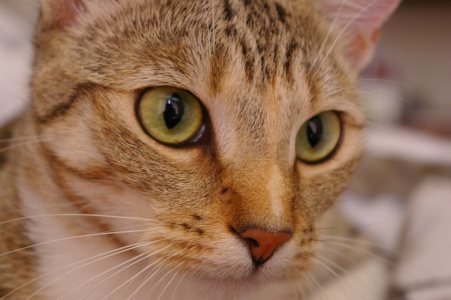

In [27]:
img = Image.fromarray(img_array) # NumPy 배열을 Pillow 이미지 객체로 변환합니다.
img # 이미지를 표시합니다.

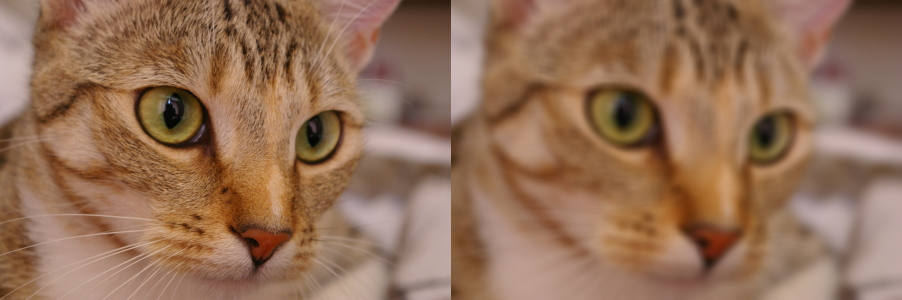

In [28]:
from PIL import ImageFilter
filter_ins = ImageFilter.BoxBlur(radius=4.5)
# 이미지에 BoxBlur 필터를 적용하여 흐리게 만듭니다.
# blurred_img = img.filter(ImageFilter.BoxBlur(radius=4.5))
blurred_img = img.filter(filter_ins)
# 원본 이미지와 흐려진 이미지를 나란히 표시합니다.
result = combine_img(img,blurred_img)
result


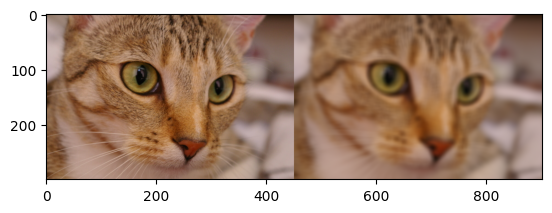

In [29]:
import matplotlib.pyplot as plt
plt.imshow(result)
plt.show()

### 1. BLUR 필터

5×5 크기의 **"도넛 모양" 커널**을 사용하여 특별한 블러 효과를 적용합니다.

**문법:**
```python
ImageFilter.BLUR
```

**BLUR 커널:**
```
1/16 * [1 1 1 1 1]  
       [1 0 0 0 1]  
       [1 0 0 0 1]  
       [1 0 0 0 1]  
       [1 1 1 1 1]
```

**특징:**
- 매개변수 없음 (고정된 5×5 커널)
- 테두리 16개 픽셀만 사용 (가중치 1)
- 중앙 9개 픽셀은 무시 (가중치 0)
- 일반적인 박스 블러와 다른 독특한 효과

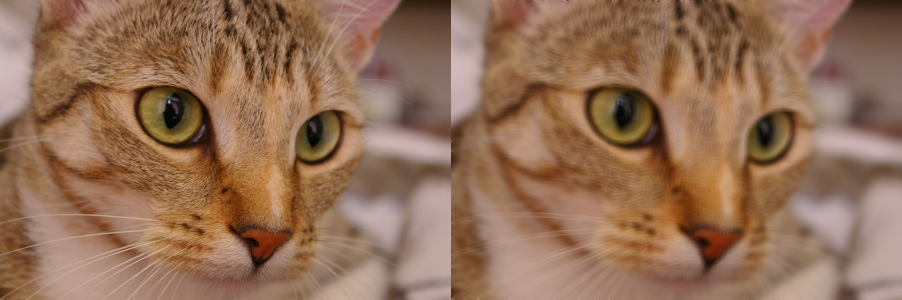

In [30]:
from PIL import ImageFilter
# ImageFilter.BLUR를 사용하여 이미지를 흐리게 처리합니다.
blurred_img = img.filter(ImageFilter.BLUR)
# 원본 이미지와 흐려진 이미지를 나란히 표시합니다.
combine_img(img,blurred_img)

### 2. GaussianBlur 필터

**가우시안 분포**를 사용한 가장 널리 사용되는 blurring filter입니다.

**문법:**
```python
ImageFilter.GaussianBlur(radius=2)
```

**가우시안 수식:**
$$G(x, y) = \frac{1}{2\pi\sigma^2} \, e^{-\frac{x^2 + y^2}{2\sigma^2}}$$

여기서 σ는 radius입니다 (Standard deviation of the Gaussian kernel).

**특징:**
- `radius`: blur 반경 (기본값 2.0, 클수록 더 흐릿함)
- 가장 널리 사용되는 Blur 중 하나
- `BLUR`보다 연산량이 많지만 품질은 우수
- 배경 흐림, 노이즈 감소, 부드러운 효과에 적합

**주의:** OpenCV와 SciPy에서는 radius와 σ의 관계가 다를 수 있습니다.
- **OpenCV**: kernel_radius = 3σ
- **SciPy**: kernel_radius = int(4σ + 0.5)


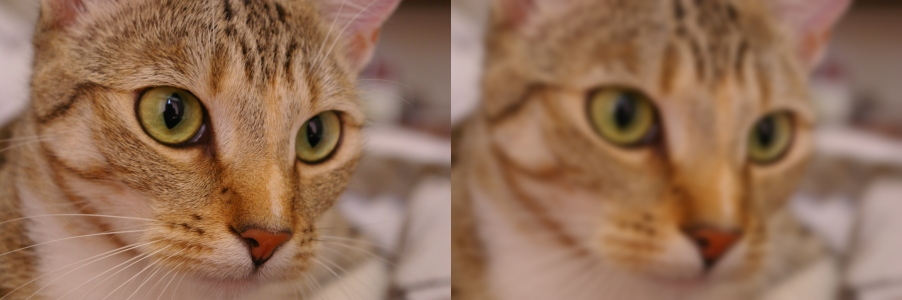

In [31]:
from PIL import ImageFilter
# 반지름 3의 가우시안 블러 필터를 생성합니다.
gaussian_blur_3 = ImageFilter.GaussianBlur(radius=3)
# 이미지에 가우시안 블러를 적용합니다.
blurred_img_3 = img.filter(gaussian_blur_3)
# 원본 이미지와 흐려진 이미지를 나란히 표시합니다.
combine_img(img, blurred_img_3)

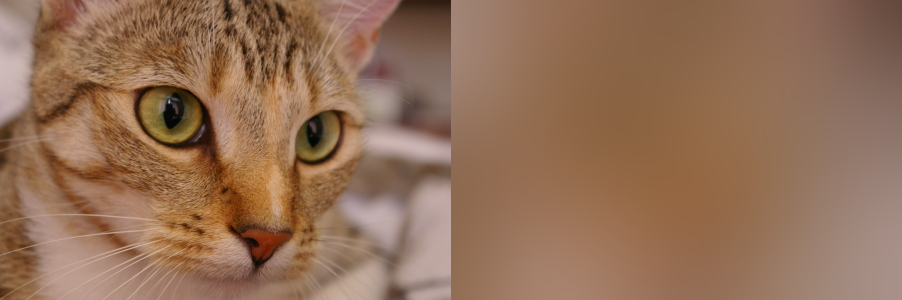

In [32]:
# 반경 5의 가우시안 블러 필터를 생성합니다.
gaussian_blur = ImageFilter.GaussianBlur(radius=50)
# 이미지에 가우시안 블러를 적용합니다.
blurred_img = img.filter(gaussian_blur)
# 원본 이미지와 흐려진 이미지를 나란히 표시합니다.
combine_img(img,blurred_img)

### 3. SHARPEN 필터

이미지의 **가장자리를 강조**하여 선명도를 향상시킵니다.

**문법:**
```python
ImageFilter.SHARPEN
```

**SHARPEN 커널:**
```
1/16 * [-2 -2 -2]
       [-2 32 -2]
       [-2 -2 -2]
```

**특징:**
- 매개변수 없음 (고정된 3×3 커널)
- 중심 픽셀을 강조하고 주변 픽셀을 약화
- 흐릿한 이미지의 선명도 복원에 사용
- 과도하게 적용하면 노이즈 증가 및 부자연스러운 효과


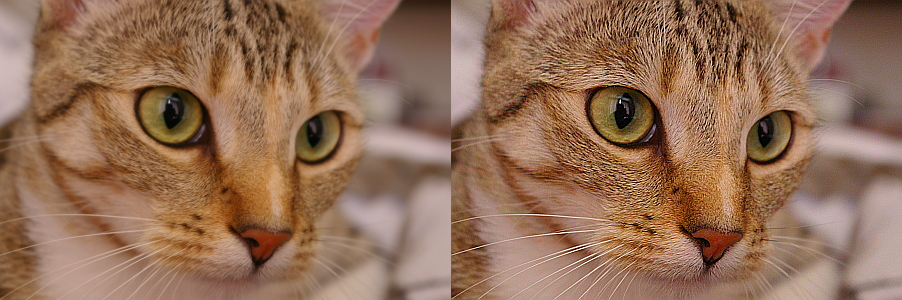

In [33]:
# ImageFilter.SHARPEN을 사용하여 이미지를 선명하게 만듭니다.
sharpened_img = img.filter(ImageFilter.SHARPEN)
sharpened_img = sharpened_img.filter(ImageFilter.SHARPEN)

# 원본 이미지와 선명해진 이미지를 나란히 표시합니다.
combine_img(img,sharpened_img)

### 4. EDGE_ENHANCE 필터

이미지의 **가장자리를 강화**하여 윤곽선을 더욱 뚜렷하게 만듭니다.

**문법:**
```python
ImageFilter.EDGE_ENHANCE
```

**커널:**
```
1/2 * [-1 -1 -1]
      [-1 10 -1]
      [-1 -1 -1]
```

**특징:**
- 매개변수 없음 (고정된 3×3 커널)
- SHARPEN보다 가장자리 강화 효과가 더 강함
- 윤곽선을 뚜렷하게 하면서 전체 이미지 품질 유지

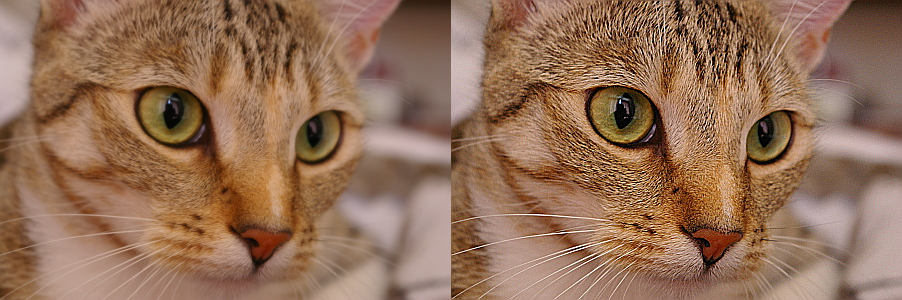

In [34]:
# ImageFilter.EDGE_ENHANCE를 사용하여 이미지의 가장자리를 강조합니다.
edge_enhanced = img.filter(ImageFilter.EDGE_ENHANCE)
# 원본 이미지와 가장자리가 강조된 이미지를 나란히 표시합니다.
combine_img(img,edge_enhanced)

### 5. FIND_EDGES 필터

이미지에서 **가장자리를 검출**하여 윤곽선만 남깁니다.

**문법:**
```python
ImageFilter.FIND_EDGES
```

**커널:**
```
[-1 -1 -1]
[-1  8 -1]
[-1 -1 -1]
```

**특징:**
- 매개변수 없음 (고정된 3×3 커널)
- 가장자리 검출용 필터
- 원본 이미지의 윤곽선만 추출
- 객체 분할, 형태 분석에 활용


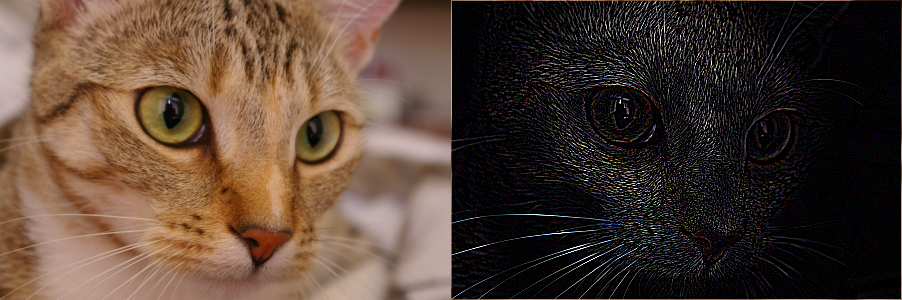

In [35]:
# ImageFilter.FIND_EDGES를 사용하여 이미지에서 가장자리를 찾습니다.
edges = img.filter(ImageFilter.FIND_EDGES)
# 원본 이미지와 가장자리가 추출된 이미지를 나란히 표시합니다.
combine_img(img,edges)

In [36]:
edges.mode

'RGB'

### 6. CONTOUR 필터

이미지의 **윤곽선을 검출**합니다.

**문법:**
```python
ImageFilter.CONTOUR
```

**커널:**
```
[-1 -1 -1]
[-1  8 -1]
[-1 -1 -1]
```

**특징:**
- 매개변수 없음 (고정된 3×3 커널)
- FIND_EDGES와 유사하지만 결과가 다를 수 있음
- 윤곽선 검출에 사용


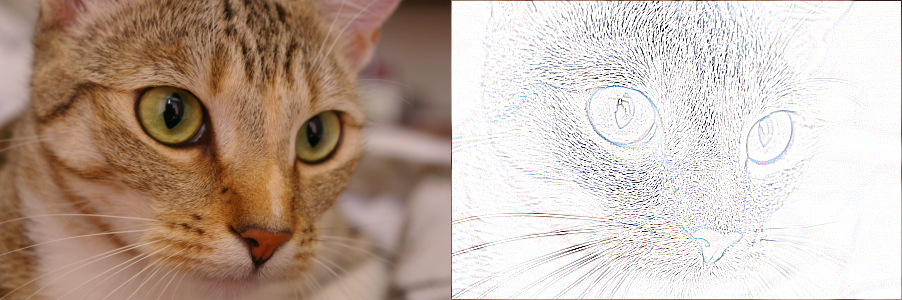

In [37]:
# ImageFilter.CONTOUR를 사용하여 이미지 윤곽선을 찾습니다.
contour = img.filter(ImageFilter.CONTOUR)
# 원본 이미지와 윤곽선이 추출된 이미지를 나란히 표시합니다.
combine_img(img,contour)

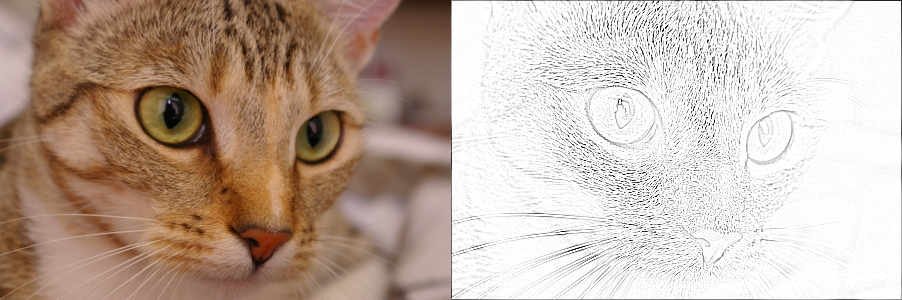

In [38]:
# ImageFilter.CONTOUR를 사용하여 이미지 윤곽선을 찾습니다.
contour = img.filter(ImageFilter.CONTOUR)
# 윤곽선 이미지를 그레이스케일로 변환합니다.
contour_gray = contour.convert('L')
# 원본 이미지와 윤곽선이 추출된 그레이스케일 이미지를 나란히 표시합니다.
combine_img(img, contour_gray)

### 7. EMBOSS 필터

이미지에 **엠보싱(양각) 효과**를 적용하여 입체감을 만듭니다.

**문법:**
```python
ImageFilter.EMBOSS
```

**커널:**
```
[-1  0  0]
[ 0  1  0]
[ 0  0  1]
```

**특징:**
- 매개변수 없음 (고정된 3×3 커널)
- 이미지에 3D 입체감 부여
- 가장자리를 강조하여 양각 효과 생성
- 그레이스케일 이미지에 특히 효과적

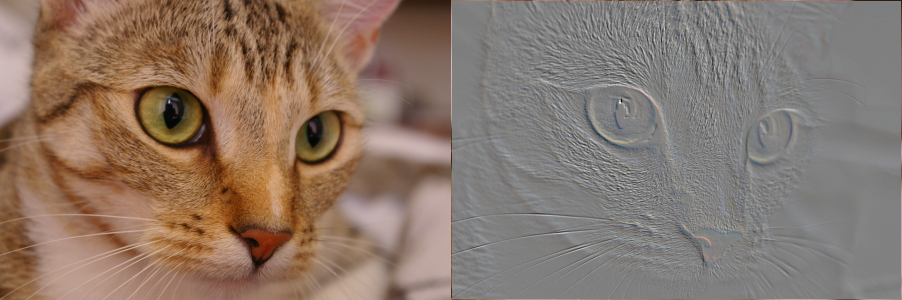

In [39]:
# ImageFilter.EMBOSS를 사용하여 이미지를 엠보싱 처리합니다.
embossed = img.filter(ImageFilter.EMBOSS)
# 원본 이미지와 엠보싱 처리된 이미지를 나란히 표시합니다.
combine_img(img, embossed)

### 8. EDGE_ENHANCE_MORE 필터

EDGE_ENHANCE보다 **더 강한 가장자리 강화** 효과를 제공합니다.

**문법:**
```python
ImageFilter.EDGE_ENHANCE_MORE
```

**특징:**
- 매개변수 없음 (고정된 3×3 커널)
- EDGE_ENHANCE보다 더 강력한 효과
- 가장자리를 극대화하여 강조

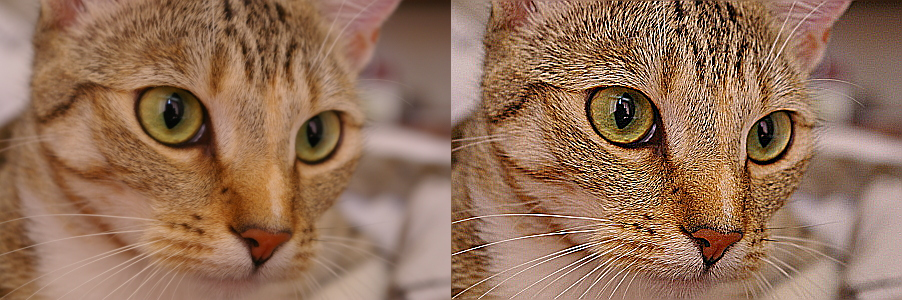

In [40]:
# ImageFilter.EDGE_ENHANCE_MORE를 사용하여 이미지의 가장자리를 더 강조합니다.
edge_enhance_more = img.filter(ImageFilter.EDGE_ENHANCE_MORE)
# 원본 이미지와 더 강하게 가장자리가 강조된 이미지를 나란히 표시합니다.
combine_img(img, edge_enhance_more)

### 9. UnsharpMask 필터

**언샤프 마스킹**을 통해 이미지를 선명하게 만듭니다.

**문법:**
```python
ImageFilter.UnsharpMask(radius=2, percent=150, threshold=3)
```

**파라미터:**
- `radius`: blur 반경
- `percent`: 샤프닝 강도 (백분율)
- `threshold`: 샤프닝 적용 임계값

**특징:**
- 세밀한 제어 가능
- 전문가용 샤프닝 필터
- 사진 보정에 널리 사용

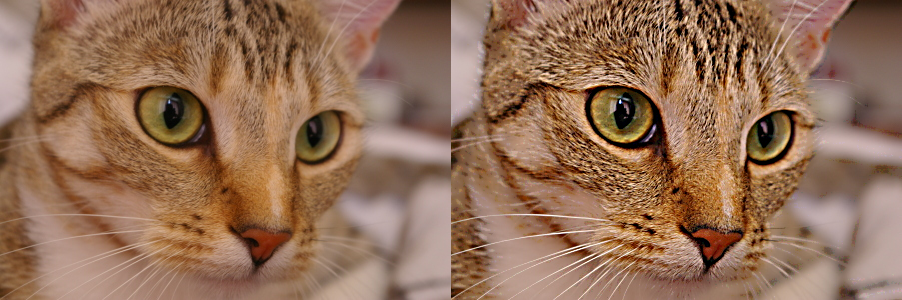

In [41]:
# 반경, 비율, 임계값을 사용한 언샤프 마스크 필터를 생성합니다.
unsharp = ImageFilter.UnsharpMask(radius=3, percent=200, threshold=5)
# 언샤프 마스크 필터를 적용하여 이미지를 선명하게 만듭니다.
sharpened = img.filter(unsharp)
# 원본 이미지와 선명해진 이미지를 나란히 표시합니다.
combine_img(img,sharpened)

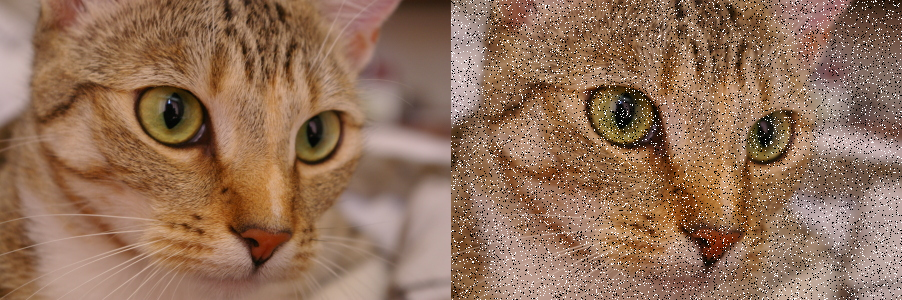

In [42]:
import numpy as np
from PIL import Image

def add_salt_and_pepper_noise(image: Image.Image, salt_vs_pepper: float, amount: float) -> Image.Image:
    # 이미지에 소금-후추 노이즈를 추가하는 함수를 정의합니다.
    img_array = np.array(image) # 이미지를 NumPy 배열로 변환합니다.
    noisy_img_array = np.copy(img_array) # 노이즈가 추가될 이미지 배열을 복사합니다.
    
    # 소금 노이즈 추가
    num_salt = np.ceil(amount * img_array.size * salt_vs_pepper).astype(int)
    coords_salt_x = np.random.randint(0, img_array.shape[0], num_salt)
    coords_salt_y = np.random.randint(0, img_array.shape[1], num_salt)
    noisy_img_array[coords_salt_x, coords_salt_y] = 255
    
    # 후추 노이즈 추가
    num_pepper = np.ceil(amount * img_array.size * (1.0 - salt_vs_pepper)).astype(int)
    coords_pepper_x = np.random.randint(0, img_array.shape[0], num_pepper)
    coords_pepper_y = np.random.randint(0, img_array.shape[1], num_pepper)
    noisy_img_array[coords_pepper_x, coords_pepper_y] = 0
    
    return Image.fromarray(noisy_img_array)

# 이미지에 소금-후추 노이즈를 추가합니다.
noisy_img = add_salt_and_pepper_noise(img, salt_vs_pepper=0.5, amount=0.04)
combine_img(img, noisy_img)

### 10. MedianFilter 필터

주변 픽셀들의 **중간값**을 사용하여 노이즈를 제거하는 **non-linear filter**입니다.

**문법:**
```python
ImageFilter.MedianFilter(size=3)
```

**중간값 필터 수식:**
```
output(x,y) = median{input(x+i, y+j) | i,j ∈ [-size/2, size/2]}
```

**특징:**
- `size`: 필터 크기 (기본값 3, **홀수 int만 가능**)
- **가장자리를 보존**하면서 노이즈 제거
- **Salt and Pepper noise 제거에 매우 효과적**
- blur 필터와 달리 가장자리가 흐려지지 않음

**사용 예:**

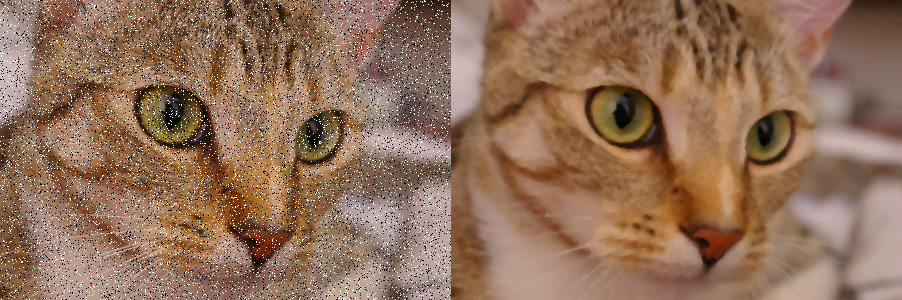

In [43]:
# 크기 5의 미디언 필터를 생성합니다.
median = ImageFilter.MedianFilter(size=5)
# 노이즈가 포함된 이미지에 미디언 필터를 적용하여 노이즈를 제거합니다.
denoised = noisy_img.filter(median)
# 노이즈가 있는 이미지와 노이즈 제거된 이미지를 나란히 표시합니다.
combine_img(noisy_img, denoised)

## Custom Filter

### Custom Kernel Filter

Pillow는 사용자가 직접 정의한 **custom kernel**을 사용하는 기능도 제공합니다.

**문법:**
```python
ImageFilter.Kernel(size, kernel, scale=None, offset=0)
```

**파라미터:**
- `size`: 커널 크기 (튜플, 예: `(3, 3)`)
- `kernel`: 커널 값들의 리스트 (평탄화된 형태)
- `scale`: 정규화 스케일 (기본값: kernel 값들의 합)
- `offset`: 결과에 더해질 오프셋 값

**특징:**
- Convolution 기반의 임의의 필터 구현 가능
- NumPy 배열을 `flatten().tolist()`로 변환하여 사용
- 다양한 image processing 알고리즘 직접 구현 가능

**사용 예:**


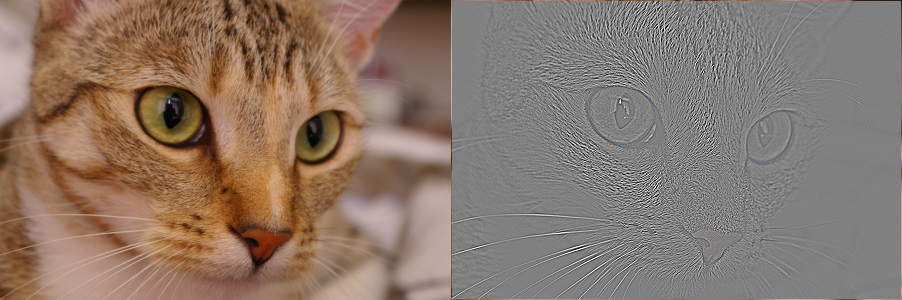

In [44]:
from PIL import ImageFilter
import numpy as np

# 3x3 사용자 정의 커널을 정의합니다.
kernel = np.array([[0, -1, 0],
                   [-1, 4,-1],
                   [0, -1, 0]])

# 커널을 사용하여 PIL ImageFilter.Kernel 객체를 생성합니다.
pil_kernel = ImageFilter.Kernel((3, 3), kernel.flatten().tolist(), 1, 128)

# 사용자 정의 커널을 이미지에 적용합니다.
custom_filtered = img.filter(pil_kernel)

# 원본 이미지와 필터 적용된 이미지를 나란히 표시합니다.
combine_img(img, custom_filtered)